Fit Baker et al. data with linear-nonlinear model with sigmoid transfer function.

$$r = r_{min} + (r_{max} - r_{min})\left[\frac{\tanh\left(\beta (\mathbf{h}^T\mathbf{x} - z_0)]\right) + 1}{2}\right]$$

In [1]:
%matplotlib inline
from copy import deepcopy as copy
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import optimize, signal, stats
import sys

from disp import set_font_size

cc = np.concatenate

FPS = 8.5
DT = 1/FPS
NT = 300
T = DT*np.arange(NT) - 10

IT_STIM = (85, 170)
IDUR_STIM = IT_STIM[1] - IT_STIM[0]
DUR_STIM = DT*IDUR_STIM

T_COLS = [f'IT_{it}' for it in range(NT)]

IDUR_H = 85
T_H = np.arange(0, IDUR_H)*DT
H_T_COLS = [f'IT_H_S_{it}' for it in range(IDUR_H)] + [f'IT_H_P_{it}' for it in range(IDUR_H)]

LOAD_FILE = 'data/simple/neur/baker.csv'

In [2]:
# load data
df = pd.read_csv(LOAD_FILE)
expt_ids = np.sort(np.unique(df['EXPT_ID']))

df

,EXPT_ID,STIM,LINE,FLY,ROI,ROI_USED,IT_0,IT_1,IT_2,IT_3,...,IT_290,IT_291,IT_292,IT_293,IT_294,IT_295,IT_296,IT_297,IT_298,IT_299
0,0,S,R70G01,0,somas,False,-0.286139,-0.251529,-0.214845,-0.085881,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,P,R70G01,0,somas,False,-0.090690,-0.071585,0.027546,-0.089212,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,S,R70G01,1,somas,False,-0.074163,-0.052967,-0.226459,-0.086673,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,P,R70G01,1,somas,False,-0.094280,-0.175828,-0.132839,-0.155376,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2,S,R70G01,2,somas,False,-0.359071,-0.296972,-0.283760,-0.206650,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
443,221,P,vPN1_split,0,somas,False,0.308926,0.069519,-0.028961,-0.103122,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
444,222,S,vPN1_split,1,somas,False,0.268154,0.517779,0.526319,0.353496,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
445,222,P,vPN1_split,1,somas,False,0.563747,0.506288,0.271983,0.002747,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
446,223,S,vPN1_split,2,somas,False,0.023391,0.023677,0.009701,0.006185,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Step I: Generate initial guess for filter using linear fit to pre- & during stim period

In [3]:
# smln function
def smlt_lin(
        x_s_0, tau_s_0, x_s_1, tau_s_1,
        x_p_0, tau_p_0, x_p_1, tau_p_1, t_0, inp):
    """Simulate response to sine or pulse inputs."""
    stim = np.zeros(NT)
    stim[(t_0 <= T) & (T < t_0 + DUR_STIM)] = 1
    
    h_s = x_s_0*np.exp(-T_H/tau_s_0) + x_s_1*np.exp(-T_H/tau_s_1)
    h_p = x_p_0*np.exp(-T_H/tau_p_0) + x_p_1*np.exp(-T_H/tau_p_1)

    if inp == 's':
        r = signal.fftconvolve(stim, h_s, mode='full')[:NT]*DT
    elif inp == 'p':
        r = signal.fftconvolve(stim, h_p, mode='full')[:NT]*DT
    
    return r

Fit linear filters forced to be sum of two exponentials.

In [4]:
# load dyn model fits to get initial filter param guesses
df_dyn_fit_param = pd.read_csv('data/simple/neur/baker_dyn_fit_param.csv')
df_dyn_fit_param

,EXPT_ID,LINE,FLY,ROI,ROI_USED,FIT_ERR,SUCCESS,T_0,R_0,TAU_R,TAU_A,X_S,X_P
0,0,R70G01,0,somas,False,0.275200,True,-0.000000,0.028882,6.202615,30.336758,-4.958290,-2.597432
1,1,R70G01,1,somas,False,0.186212,True,0.117647,0.025128,3.835468,21.821295,-4.163967,-1.472075
2,2,R70G01,2,somas,False,0.248414,True,-0.000000,0.055962,6.017162,15.058055,-6.248007,-2.095952
3,3,R70G01,3,somas,False,0.455963,True,-0.000000,-0.014227,6.016828,11.820576,-5.679735,-2.118245
4,4,R70G01,4,somas,False,0.229018,True,-0.000000,0.019831,6.434825,55.496220,-4.415761,-2.863647
...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,219,VT34811,0,somas,False,0.276087,True,-0.000000,0.039119,1.799608,1440.994269,-0.049828,2.494657
220,220,VT34811,0,ascending projection,False,0.037801,True,-0.000000,-0.001886,1.298841,27.643238,0.098451,2.457383
221,221,vPN1_split,0,somas,False,0.404112,True,-0.588235,-0.014702,4.151226,6.155551,8.332263,2.353217
222,222,vPN1_split,1,somas,False,1.205977,True,0.235294,-0.095665,5.924070,90.705238,2.390705,0.604586


In [5]:
# get initial params
p_0_all = {
    'r_0': np.zeros(len(df_dyn_fit_param)),
    
    'x_s_0': np.array(df_dyn_fit_param['X_S']),
    'tau_s_0': np.array(df_dyn_fit_param['TAU_R']),
    'x_s_1': np.array(df_dyn_fit_param['X_S']),
    'tau_s_1': np.array(df_dyn_fit_param['TAU_A']),
    
    'x_p_0': np.array(df_dyn_fit_param['X_P']),
    'tau_p_0': np.array(df_dyn_fit_param['TAU_R']),
    'x_p_1': np.array(df_dyn_fit_param['X_P']),
    'tau_p_1': np.array(df_dyn_fit_param['TAU_A']),
}

p_0_hand = {  # hand picked params for neurons that don't converge properly
    10: {
        'x_s_0': 0.812320, 'tau_s_0': 3.990922, 'x_s_1': -0.045677, 'tau_s_1': 119.803153,
        'x_p_0': -0.003437, 'tau_p_0': 4.737647, 'x_p_1': 0.088676, 'tau_p_1': 119.804143,
    },
    57: {
        'x_s_0': 28.953414, 'tau_s_0': 0.001000, 'x_s_1': -0.919826, 'tau_s_1': 4.382616,
        'x_p_0': 2.453198, 'tau_p_0': 1.901183, 'x_p_1': -0.919826, 'tau_p_1': 4.382616,
    },
    61: {
        'x_s_0': 28.953414, 'tau_s_0': 0.001000, 'x_s_1': -0.919826, 'tau_s_1': 4.382616,
        'x_p_0': 2.453198, 'tau_p_0': 1.901183, 'x_p_1': -0.919826, 'tau_p_1': 4.382616,
    },
    62: {
        'x_s_0': 28.953414, 'tau_s_0': 0.001000, 'x_s_1': -0.919826, 'tau_s_1': 4.382616,
        'x_p_0': 2.453198, 'tau_p_0': 1.901183, 'x_p_1': -0.919826, 'tau_p_1': 4.382616,
    },
    66: {
        'x_s_0': -2.619425, 'tau_s_0': 1.953434, 'x_s_1': 45.090475, 'tau_s_1': 0.001000,
        'x_p_0': -0.097508, 'tau_p_0': 18.944586, 'x_p_1': -1.605105, 'tau_p_1': 0.001000,
    },
    78: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    79: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    80: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    81: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    82: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    104: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    105: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    107: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    108: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    109: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    118: {
        'x_s_0': 8.576145, 'tau_s_0': 0.001000, 'x_s_1': -2.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    141: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    142: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    143: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    144: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    145: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    173: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    176: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    177: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    178: {
        'x_s_0': 5.003609, 'tau_s_0': 0.001000, 'x_s_1': -.257519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    179: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    180: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    183: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    184: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    185: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    200: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 6.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    201: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    202: {
        'x_s_0': 30.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 30.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
    204: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    205: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    206: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    207: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    208: {
        'x_s_0': 4.576145, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 2.146426,
        'x_p_0': 49.003609, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 3.4,
    },
    210: {
        'x_s_0': 49.003609, 'tau_s_0': 0.001000, 'x_s_1': -1.157519, 'tau_s_1': 3.4,
        'x_p_0': 4.576145, 'tau_p_0': 0.001000, 'x_p_1': -1.157519, 'tau_p_1': 2.146426,
    },
}

for expt_id, p_0 in p_0_hand.items():
    for k, v in p_0.items():
        p_0_all[k][expt_id] = v

In [6]:
# objective function for linear fit
def obj_lin2e(param, t_0, r_s, r_p):
    # unpack parameters (9 total)
    r_0 = param[0]  # y-offset
    ## two amplitudes and taus for each song mode
    x_s_0, tau_s_0, x_s_1, tau_s_1 = param[1:5]
    x_p_0, tau_p_0, x_p_1, tau_p_1 = param[5:9]
    
    pred_s = smlt_lin(
        x_s_0=x_s_0, tau_s_0=tau_s_0, x_s_1=x_s_1, tau_s_1=tau_s_1,
        x_p_0=x_p_0, tau_p_0=tau_p_0, x_p_1=x_p_1, tau_p_1=tau_p_1,
        t_0=t_0, inp='s') + r_0
    
    pred_p = smlt_lin(
        x_s_0=x_s_0, tau_s_0=tau_s_0, x_s_1=x_s_1, tau_s_1=tau_s_1,
        x_p_0=x_p_0, tau_p_0=tau_p_0, x_p_1=x_p_1, tau_p_1=tau_p_1,
        t_0=t_0, inp='p') + r_0
    
    # compute error
    sq_err = np.nanmean((pred_s-r_s)**2 + (pred_p-r_p)**2)
    
    return sq_err

BDS_OBJ = [
    (None, None),  # y-offset r_0
    (None, None), (.001, None), (None, None), (.001, None),  # x_s_0, tau_s_0, x_s_1, tau_s_1
    (None, None), (.001, None), (None, None), (.001, None),  # x_p_0, tau_p_0, x_p_1, tau_p_1
]

In [7]:
# loop over expt_ids
cols_pred_lin = df.columns
data_pred_lin = []

cols_param_lin = ['EXPT_ID', 'LINE', 'FLY', 'ROI', 'ROI_USED', 'FIT_ERR', 'SUCCESS', 'IDUR_H'] \
    + ['T_0', 'R_0', 'X_S_0', 'TAU_S_0', 'X_S_1', 'TAU_S_1', 'X_P_0', 'TAU_P_0', 'X_P_1', 'TAU_P_1']
data_param_lin = []

for expt_id in expt_ids:
    sys.stdout.write('.')
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    line = row_s['LINE']
    fly = row_s['FLY']
    roi = row_s['ROI']
    roi_used = row_s['ROI_USED']
    
    r_s = np.array(row_s[T_COLS]).astype(float)
    r_p = np.array(row_p[T_COLS]).astype(float)
    
    r_s[DUR_STIM < T] = np.nan
    r_p[DUR_STIM < T] = np.nan
    
    # set initial params
    p_0 = np.array([
        p_0_all[key][expt_id] for key in 
        ['r_0', 'x_s_0', 'tau_s_0', 'x_s_1', 'tau_s_1', 'x_p_0', 'tau_p_0', 'x_p_1', 'tau_p_1']
    ])
    
    # fit model
    t_0s = -DT*np.arange(-2, 9)
    obj_best = np.inf
    for t_0 in t_0s:
        fit_rslt = optimize.minimize(obj_lin2e, p_0, args=(t_0, r_s, r_p), bounds=BDS_OBJ)  # try default (BFGS) first
        if not fit_rslt.success:  # try Nelder-Mead
            fit_rslt = optimize.minimize(obj_lin2e, p_0, args=(t_0, r_s, r_p), bounds=BDS_OBJ, method='Nelder-Mead', options={'maxiter': 1e5})
            
        if fit_rslt.fun < obj_best:
            fit_rslt_best = copy(fit_rslt)
            t_0_best = t_0
            
            obj_best = fit_rslt.fun
            
    fit_rslt = fit_rslt_best
    t_0 = t_0_best
    
    p_found = fit_rslt.x
    
    # unpack params
    r_0, x_s_0, tau_s_0, x_s_1, tau_s_1, x_p_0, tau_p_0, x_p_1, tau_p_1 = p_found
    
    # make predictions
    pred_s = smlt_lin(
        x_s_0=x_s_0, tau_s_0=tau_s_0, x_s_1=x_s_1, tau_s_1=tau_s_1,
        x_p_0=x_p_0, tau_p_0=tau_p_0, x_p_1=x_p_1, tau_p_1=tau_p_1,
        t_0=t_0, inp='s') + r_0
    
    pred_p = smlt_lin(
        x_s_0=x_s_0, tau_s_0=tau_s_0, x_s_1=x_s_1, tau_s_1=tau_s_1,
        x_p_0=x_p_0, tau_p_0=tau_p_0, x_p_1=x_p_1, tau_p_1=tau_p_1,
        t_0=t_0, inp='p') + r_0
    
    # store predictions
    pred_dict_s = {'EXPT_ID': expt_id, 'STIM': 'S', 'LINE': line, 'FLY': fly, 'ROI': roi, 'ROI_USED': roi_used}
    pred_dict_p = {'EXPT_ID': expt_id, 'STIM': 'P', 'LINE': line, 'FLY': fly, 'ROI': roi, 'ROI_USED': roi_used}
    
    # add time cols
    for it, t_col in enumerate(T_COLS):
        pred_dict_s[t_col] = pred_s[it]
        pred_dict_p[t_col] = pred_p[it]
        
    data_pred_lin.extend([pred_dict_s, pred_dict_p])
    
    # store params
    param_dict = {'EXPT_ID': expt_id, 'LINE': line, 'FLY': fly, 'ROI': roi, 'ROI_USED': roi_used}
    param_dict['FIT_ERR'] = np.sqrt(np.nanmean((pred_s - r_s)**2 + (pred_p - r_p)**2))
    param_dict['SUCCESS'] = 1
    param_dict['IDUR_H'] = IDUR_H
    param_dict['T_0'] = t_0
    param_dict['R_0'] = r_0
    param_dict['X_S_0'] = x_s_0
    param_dict['TAU_S_0'] = tau_s_0
    param_dict['X_S_1'] = x_s_1
    param_dict['TAU_S_1'] = tau_s_1
    param_dict['X_P_0'] = x_p_0
    param_dict['TAU_P_0'] = tau_p_0
    param_dict['X_P_1'] = x_p_1
    param_dict['TAU_P_1'] = tau_p_1
    
    data_param_lin.append(param_dict)

................................................................................................................................................................................................................................

In [8]:
df_param_lin = pd.DataFrame(columns=cols_param_lin, data=data_param_lin)
df_pred_lin = pd.DataFrame(columns=cols_pred_lin, data=data_pred_lin)

In [9]:
df_param_lin.to_csv('data/simple/neur/baker_ln2e_fit_param_lin_init.csv', index=False)
df_pred_lin.to_csv('data/simple/neur/baker_ln2e_fit_pred_lin_init.csv', index=False)

# Examine fits

In [10]:
df_param_lin = pd.read_csv('data/simple/neur/baker_ln2e_fit_param_lin_init.csv')
df_pred_lin = pd.read_csv('data/simple//neur/baker_ln2e_fit_pred_lin_init.csv')

In [11]:
df_param_lin

,EXPT_ID,LINE,FLY,ROI,ROI_USED,FIT_ERR,SUCCESS,IDUR_H,T_0,R_0,X_S_0,TAU_S_0,X_S_1,TAU_S_1,X_P_0,TAU_P_0,X_P_1,TAU_P_1
0,0,R70G01,0,somas,False,0.115709,1,85,-0.000000,-0.002979,-0.908579,3.501473,0.012138,30.225011,-0.625309,5.923357,0.157584,30.324496
1,1,R70G01,1,somas,False,0.159543,1,85,0.117647,-0.000119,-1.306166,2.377407,0.047245,21.768498,-0.422502,3.397092,0.051389,21.832882
2,2,R70G01,2,somas,False,0.167352,1,85,0.235294,0.011285,-2.655397,0.010427,-1.142775,2.558741,-225.443012,50.005303,225.108502,50.476837
3,3,R70G01,3,somas,False,0.428132,1,85,0.235294,0.002852,-1.505341,1.770936,0.011051,8.549414,-1.604876,0.460181,-0.018855,10.583240
4,4,R70G01,4,somas,False,0.163628,1,85,0.117647,0.003535,-0.948013,1.429389,-0.174450,55.453632,-0.625801,7.053648,0.135529,55.496898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,219,VT34811,0,somas,False,0.256069,1,85,-0.000000,0.005122,0.637122,0.244495,-0.040116,1440.994265,1.499413,1.499165,0.021028,1440.994268
220,220,VT34811,0,ascending projection,False,0.037871,1,85,-0.000000,0.001655,0.094150,1.287557,-0.009212,27.643170,1.938678,1.291020,-0.101250,27.629590
221,221,vPN1_split,0,somas,False,0.344586,1,85,-0.000000,-0.004897,5.139117,0.743549,-0.231428,7.409883,1.457943,2.614511,-0.676709,5.652061
222,222,vPN1_split,1,somas,False,1.121563,1,85,0.235294,-0.012085,143.362682,89.194917,-143.005814,91.758724,-0.199893,0.777168,0.128077,90.430285


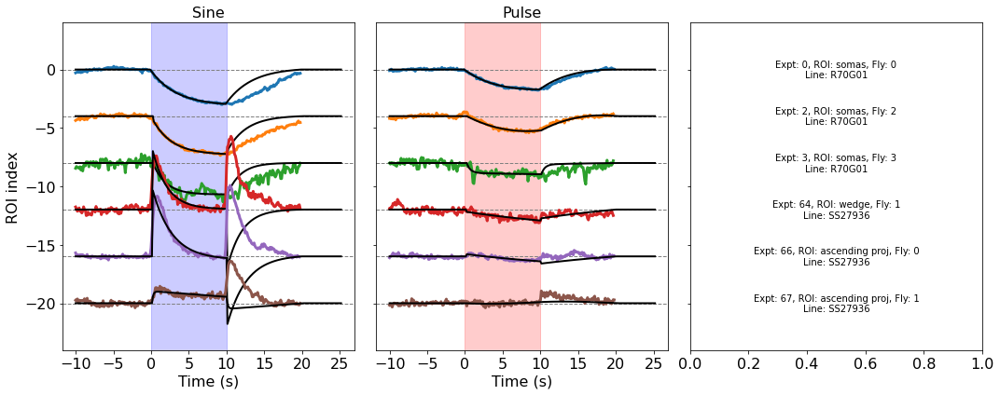

In [12]:
# expt_ids_plot = [0, 1, 2, 3, 4, 5, 6, 9]
expt_ids_plot = [0, 2, 3, 64, 66, 67]
nroi_plot = len(expt_ids_plot)
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(15, nroi_plot), sharey=True,  tight_layout=True)
# for cexpt, expt_id in enumerate(expt_ids):
for cexpt, expt_id in enumerate(expt_ids_plot):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    axs[0].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 4*cexpt, lw=3)
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 4*cexpt, lw=3)
    
    axs[2].text(0.5, -4*cexpt, f'Expt: {expt_id}, ROI: {roi}, Fly: {fly}\nLine: {line}', ha='center', va='center')
    
    # prediction
    ## sine response
    row_s = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 4*cexpt, lw=2, c='k')
    
    ## pulse response
    row_p = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 4*cexpt, lw=2, c='k')
    
axs[0].set_ylabel('ROI index')

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_ylim(-4*nroi_plot, 4)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)

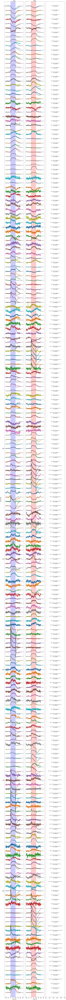

In [13]:
nroi_plot = len(expt_ids)
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(15, nroi_plot), sharey=True,  tight_layout=True)
for cexpt, expt_id in enumerate(expt_ids):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    axs[0].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 4*cexpt, lw=3)
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 4*cexpt, lw=3)
    
    axs[2].text(0.5, -4*cexpt, f'Expt: {expt_id}, ROI: {roi}, Fly: {fly}\nLine: {line}', ha='center', va='center')
    
    # prediction
    ## sine response
    row_s = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 4*cexpt, lw=2, c='k')
    
    ## pulse response
    row_p = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 4*cexpt, lw=2, c='k')
    
axs[0].set_ylabel('ROI index')

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_ylim(-4*nroi_plot, 4)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)

# Step II: jointly optimize filter and nonlinearity

In [14]:
# get initial params
p_0_all = {
    't_0': np.array(df_param_lin['T_0']),
    'x_s_0': np.array(df_param_lin['X_S_0']),
    'tau_s_0': np.array(df_param_lin['TAU_S_0']),
    'x_s_1': np.array(df_param_lin['X_S_1']),
    'tau_s_1': np.array(df_param_lin['TAU_S_1']),
    'x_p_0': np.array(df_param_lin['X_P_0']),
    'tau_p_0': np.array(df_param_lin['TAU_P_0']),
    'x_p_1': np.array(df_param_lin['X_P_1']),
    'tau_p_1': np.array(df_param_lin['TAU_P_1']),
    # initial nonlin params are basically linear
    'r_min': -50*np.ones(len(df_param_lin)),
    'r_max': 50*np.ones(len(df_param_lin)),
    'z_0': 0*np.ones(len(df_param_lin)),
    'beta': 1/100*np.ones(len(df_param_lin)),
}

In [15]:
# smln function
def smlt(
        x_s_0, tau_s_0, x_s_1, tau_s_1,
        x_p_0, tau_p_0, x_p_1, tau_p_1,
        r_min, r_max, z_0, beta, t_0, inp):
    """Simulate response to sine or pulse inputs."""
    stim = np.zeros(NT)
    stim[(t_0 <= T) & (T < t_0 + DUR_STIM)] = 1
    
    h_s = x_s_0*np.exp(-T_H/tau_s_0) + x_s_1*np.exp(-T_H/tau_s_1)
    h_p = x_p_0*np.exp(-T_H/tau_p_0) + x_p_1*np.exp(-T_H/tau_p_1)

    if inp == 's':
        z = signal.fftconvolve(stim, h_s, mode='full')[:NT]*DT
    elif inp == 'p':
        z = signal.fftconvolve(stim, h_p, mode='full')[:NT]*DT
    
    return r_min + (r_max-r_min)*(np.tanh(beta*(z-z_0)) + 1)/2

In [16]:
# objective function for linear-nonlinear fit
def obj_ln2e(param, t_0, r_s, r_p):
    # unpack parameters (12 total)
    ## two amplitudes and taus for each song mode
    x_s_0, tau_s_0, x_s_1, tau_s_1 = param[:4]
    x_p_0, tau_p_0, x_p_1, tau_p_1 = param[4:8]
    ## sigmoid params
    r_min, r_max, z_0, beta = param[8:12]
    
    pred_s = smlt(
        x_s_0=x_s_0, tau_s_0=tau_s_0, x_s_1=x_s_1, tau_s_1=tau_s_1,
        x_p_0=x_p_0, tau_p_0=tau_p_0, x_p_1=x_p_1, tau_p_1=tau_p_1,
        r_min=r_min, r_max=r_max, z_0=z_0, beta=beta,
        t_0=t_0, inp='s')
    
    pred_p = smlt(
        x_s_0=x_s_0, tau_s_0=tau_s_0, x_s_1=x_s_1, tau_s_1=tau_s_1,
        x_p_0=x_p_0, tau_p_0=tau_p_0, x_p_1=x_p_1, tau_p_1=tau_p_1,
        r_min=r_min, r_max=r_max, z_0=z_0, beta=beta,
        t_0=t_0, inp='p')
    
    # compute error
    sq_err = .5*np.nanmean((pred_s-r_s)**2 + (pred_p-r_p)**2)
    
    return sq_err

BDS_LIN = [
    (None, None), (.001, None), (None, None), (.001, None),  # x_s_0, tau_s_0, x_s_1, tau_s_1
    (None, None), (.001, None), (None, None), (.001, None),  # x_p_0, tau_p_0, x_p_1, tau_p_1
]

In [17]:
# loop over expt_ids
cols_pred_ln = df.columns
data_pred_ln = []

cols_param_ln = ['EXPT_ID', 'LINE', 'FLY', 'ROI', 'ROI_USED', 'FIT_ERR', 'SUCCESS', 'IDUR_H'] \
    + ['T_0', 'R_0', 'X_S_0', 'TAU_S_0', 'X_S_1', 'TAU_S_1', 'X_P_0', 'TAU_P_0', 'X_P_1', 'TAU_P_1'] \
    + ['R_MIN', 'R_MAX', 'Z_0', 'BETA']
data_param_ln = []

for expt_id in expt_ids:
    sys.stdout.write(f'EXPT {expt_id}:')
    
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    line = row_s['LINE']
    fly = row_s['FLY']
    roi = row_s['ROI']
    roi_used = row_s['ROI_USED']
    
    r_s = np.array(row_s[T_COLS]).astype(float)
    r_p = np.array(row_p[T_COLS]).astype(float)
    
    r_bound = 3 * np.nanmax([np.abs(cc([r_s, r_p]))])
    
    # get initial linear fit params
    t_0 = p_0_all['t_0'][expt_id]
    
    # fit sigmoid while holding filter params fixed
    bounds = [(-r_bound, r_bound), (-r_bound, r_bound), (None, None), (None, None)]  # r_min, r_max, z_0, beta
    
    def obj_sgm(param, t_0, r_s, r_p):
        r_min, r_max, z_0, beta = param
        
        pred_s = smlt(
            x_s_0=p_0_all['x_s_0'][expt_id], tau_s_0=p_0_all['tau_s_0'][expt_id], x_s_1=p_0_all['x_s_1'][expt_id], tau_s_1=p_0_all['tau_s_1'][expt_id],
            x_p_0=p_0_all['x_p_0'][expt_id], tau_p_0=p_0_all['tau_p_0'][expt_id], x_p_1=p_0_all['x_p_1'][expt_id], tau_p_1=p_0_all['tau_p_1'][expt_id],
            r_min=r_min, r_max=r_max, z_0=z_0, beta=beta,
            t_0=t_0, inp='s')

        pred_p = smlt(
            x_s_0=p_0_all['x_s_0'][expt_id], tau_s_0=p_0_all['tau_s_0'][expt_id], x_s_1=p_0_all['x_s_1'][expt_id], tau_s_1=p_0_all['tau_s_1'][expt_id],
            x_p_0=p_0_all['x_p_0'][expt_id], tau_p_0=p_0_all['tau_p_0'][expt_id], x_p_1=p_0_all['x_p_1'][expt_id], tau_p_1=p_0_all['tau_p_1'][expt_id],
            r_min=r_min, r_max=r_max, z_0=z_0, beta=beta,
            t_0=t_0, inp='p')
        
        sq_err = .5*np.nanmean((r_s-pred_s)**2) + .5*np.nanmean((r_p-pred_p)**2)
        return sq_err
    
    fit_rslt = optimize.minimize(
        obj_sgm, [p_0_all['r_min'][expt_id], p_0_all['r_max'][expt_id], p_0_all['z_0'][expt_id], p_0_all['beta'][expt_id]],
        args=(t_0, r_s, r_p), bounds=bounds)
    sys.stdout.write(f'(min1 = {fit_rslt.fun:.5f})')
    
    p_0 = np.array([
        p_0_all['x_s_0'][expt_id],
        p_0_all['tau_s_0'][expt_id],
        p_0_all['x_s_1'][expt_id],
        p_0_all['tau_s_1'][expt_id],
        p_0_all['x_p_0'][expt_id],
        p_0_all['tau_p_0'][expt_id],
        p_0_all['x_p_1'][expt_id],
        p_0_all['tau_p_1'][expt_id],
        fit_rslt.x[0],  # r_min
        fit_rslt.x[1],  # r_max
        fit_rslt.x[2],  # z_0
        fit_rslt.x[3],  # beta
    ])
    
    # fine-tune both filter and sigmoid
    fit_rslt = optimize.minimize(obj_ln2e, p_0, args=(t_0, r_s, r_p), bounds=(BDS_LIN + bounds))
    sys.stdout.write(f'(min2 = {fit_rslt.fun:.5f})\n')
    
    p_found = fit_rslt.x
    
    x_s_0, tau_s_0, x_s_1, tau_s_1 = p_found[:4]
    x_p_0, tau_p_0, x_p_1, tau_p_1 = p_found[4:8]
    r_min, r_max, z_0, beta = p_found[8:12]

    # make predictions
    pred_s = smlt(
        x_s_0=x_s_0, tau_s_0=tau_s_0, x_s_1=x_s_1, tau_s_1=tau_s_1,
        x_p_0=x_p_0, tau_p_0=tau_p_0, x_p_1=x_p_1, tau_p_1=tau_p_1,
        r_min=r_min, r_max=r_max, z_0=z_0, beta=beta,
        t_0=t_0, inp='s')
    
    pred_p = smlt(
        x_s_0=x_s_0, tau_s_0=tau_s_0, x_s_1=x_s_1, tau_s_1=tau_s_1,
        x_p_0=x_p_0, tau_p_0=tau_p_0, x_p_1=x_p_1, tau_p_1=tau_p_1,
        r_min=r_min, r_max=r_max, z_0=z_0, beta=beta,
        t_0=t_0, inp='p')
    
    # store predictions
    pred_dict_s = {'EXPT_ID': expt_id, 'STIM': 'S', 'LINE': line, 'FLY': fly, 'ROI': roi, 'ROI_USED': roi_used}
    pred_dict_p = {'EXPT_ID': expt_id, 'STIM': 'P', 'LINE': line, 'FLY': fly, 'ROI': roi, 'ROI_USED': roi_used}
    
    # add time cols
    for it, t_col in enumerate(T_COLS):
        pred_dict_s[t_col] = pred_s[it]
        pred_dict_p[t_col] = pred_p[it]
        
    data_pred_ln.extend([pred_dict_s, pred_dict_p])
    
    # store params
    param_dict = {'EXPT_ID': expt_id, 'LINE': line, 'FLY': fly, 'ROI': roi, 'ROI_USED': roi_used}
    param_dict['FIT_ERR'] = np.sqrt(np.nanmean((pred_s - r_s)**2 + (pred_p - r_p)**2))
    param_dict['SUCCESS'] = 1
    param_dict['IDUR_H'] = IDUR_H
    param_dict['T_0'] = t_0
    
    param_dict['X_S_0'] = x_s_0
    param_dict['TAU_S_0'] = tau_s_0
    param_dict['X_S_1'] = x_s_1
    param_dict['TAU_S_1'] = tau_s_1
    
    param_dict['X_P_0'] = x_p_0
    param_dict['TAU_P_0'] = tau_p_0
    param_dict['X_P_1'] = x_p_1
    param_dict['TAU_P_1'] = tau_p_1
    
    param_dict['R_MIN'] = r_min
    param_dict['R_MAX'] = r_max
    param_dict['Z_0'] = z_0
    param_dict['BETA'] = beta
    
    data_param_ln.append(param_dict)

EXPT 0:(min1 = 0.11632)(min2 = 0.00691)
EXPT 1:(min1 = 0.04936)(min2 = 0.01262)
EXPT 2:(min1 = 0.13643)(min2 = 0.01829)
EXPT 3:(min1 = 0.21721)(min2 = 0.09792)
EXPT 4:(min1 = 0.07034)(min2 = 0.01609)
EXPT 5:(min1 = 0.14365)(min2 = 0.12598)
EXPT 6:(min1 = 0.13612)(min2 = 0.01532)
EXPT 7:(min1 = 0.13240)(min2 = 0.01662)
EXPT 8:(min1 = 0.08244)(min2 = 0.00857)
EXPT 9:(min1 = 0.37390)(min2 = 0.11939)
EXPT 10:(min1 = 0.14384)(min2 = 0.06946)
EXPT 11:(min1 = 0.05432)(min2 = 0.02003)
EXPT 12:(min1 = 0.09792)(min2 = 0.02071)
EXPT 13:(min1 = 0.04962)(min2 = 0.00296)
EXPT 14:(min1 = 0.14683)(min2 = 0.00753)
EXPT 15:(min1 = 0.17700)(min2 = 0.06341)
EXPT 16:(min1 = 0.07008)(min2 = 0.01595)
EXPT 17:(min1 = 0.19036)(min2 = 0.09521)
EXPT 18:(min1 = 0.30542)(min2 = 0.18805)
EXPT 19:(min1 = 0.15364)(min2 = 0.12327)
EXPT 20:(min1 = 0.18710)(min2 = 0.04769)
EXPT 21:(min1 = 0.03178)(min2 = 0.02959)
EXPT 22:(min1 = 0.33240)(min2 = 0.30271)
EXPT 23:(min1 = 0.28561)(min2 = 0.20978)
EXPT 24:(min1 = 0.17295)(m

In [18]:
df_param_ln = pd.DataFrame(columns=cols_param_ln, data=data_param_ln)
df_pred_ln = pd.DataFrame(columns=cols_pred_ln, data=data_pred_ln)

In [19]:
df_param_ln.to_csv('data/simple/neur/baker_ln2e_fit_param.csv', index=False)
df_pred_ln.to_csv('data/simple/neur/baker_ln2e_fit_pred.csv', index=False)

# Examine fits

In [4]:
df_param_ln = pd.read_csv('data/simple/neur/baker_ln2e_fit_param.csv')
df_pred_ln = pd.read_csv('data/simple/neur/baker_ln2e_fit_pred.csv')

In [5]:
df_param_ln

,EXPT_ID,LINE,FLY,ROI,ROI_USED,FIT_ERR,SUCCESS,IDUR_H,T_0,R_0,...,X_S_1,TAU_S_1,X_P_0,TAU_P_0,X_P_1,TAU_P_1,R_MIN,R_MAX,Z_0,BETA
0,0,R70G01,0,somas,False,0.117560,1,85,-0.000000,NaN,...,-0.154191,30.180363,-3.961294,26.948504,3.787005,30.630950,-3.381946,7.398916,0.671628,0.583010
1,1,R70G01,1,somas,False,0.158858,1,85,0.117647,NaN,...,-0.013565,21.753526,-4.049267,20.172798,3.902730,22.053586,-3.706495,8.188287,0.987402,0.400469
2,2,R70G01,2,somas,False,0.191264,1,85,0.235294,NaN,...,-0.764675,6.530992,-225.405985,50.045630,225.147387,50.422539,-3.857243,10.035773,1.907539,0.252120
3,3,R70G01,3,somas,False,0.442547,1,85,0.235294,NaN,...,-0.696203,15.725203,-1.791570,0.387985,-0.266678,12.185476,-3.277827,9.984575,5.376108,0.105360
4,4,R70G01,4,somas,False,0.179375,1,85,0.117647,NaN,...,-0.374162,55.459681,-0.545149,7.009295,0.083337,55.496544,-3.774448,8.738981,1.878088,0.225724
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,219,VT34811,0,somas,False,0.273983,1,85,-0.000000,NaN,...,0.008059,1440.994266,1.755510,1.389889,0.043692,1440.994267,-1.315365,4.037645,1.577971,0.348053
220,220,VT34811,0,ascending projection,False,0.076723,1,85,-0.000000,NaN,...,-0.004666,27.642668,4.725851,1.098195,-0.046660,27.626202,-6.206005,6.536448,0.375284,0.062548
221,221,vPN1_split,0,somas,False,0.379871,1,85,-0.000000,NaN,...,0.264978,7.350327,0.963394,0.497237,0.090109,5.033177,-8.823967,3.274269,-2.007860,0.248950
222,222,vPN1_split,1,somas,False,1.166182,1,85,0.235294,NaN,...,-142.865338,91.318485,8.985745,48.286775,-8.506011,90.451418,-10.065268,2.044586,-4.322561,0.180781


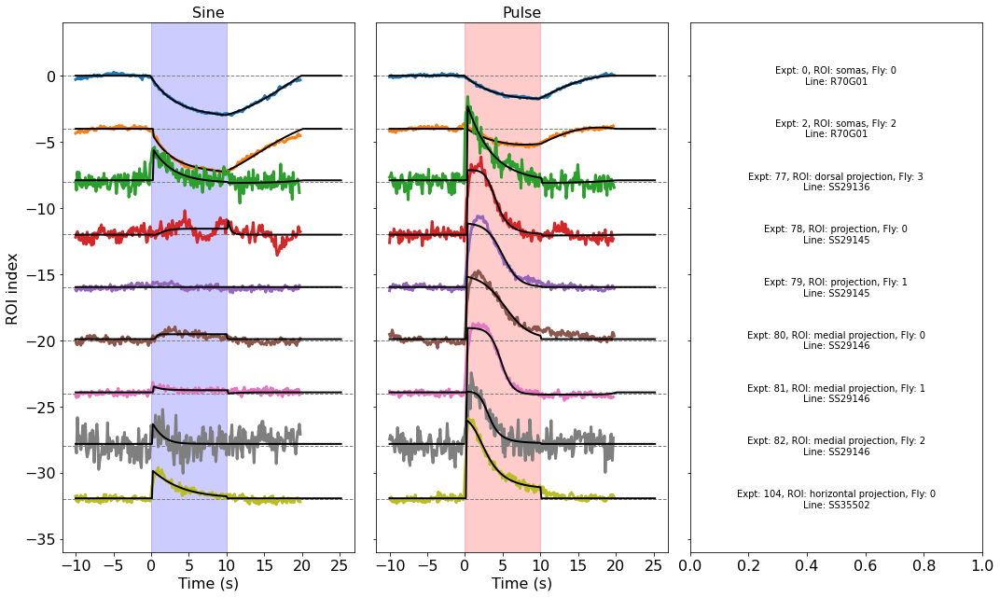

In [6]:
expt_ids_plot = [0, 2, 77, 78, 79, 80, 81, 82, 104]
# expt_ids_plot = [0, 2, 77, 78]
nroi_plot = len(expt_ids_plot)
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(15, nroi_plot), sharey=True,  tight_layout=True)
for cexpt, expt_id in enumerate(expt_ids_plot):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    axs[0].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 4*cexpt, lw=3)
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 4*cexpt, lw=3)
    
    axs[2].text(0.5, -4*cexpt, f'Expt: {expt_id}, ROI: {roi}, Fly: {fly}\nLine: {line}', ha='center', va='center')
    
    # prediction
    ## sine response
    row_s = df_pred_ln[(df_pred_ln['EXPT_ID'] == expt_id) & (df_pred_ln['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 4*cexpt, lw=2, c='k')
    
    ## pulse response
    row_p = df_pred_ln[(df_pred_ln['EXPT_ID'] == expt_id) & (df_pred_ln['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 4*cexpt, lw=2, c='k')
    
axs[0].set_ylabel('ROI index')

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_ylim(-4*nroi_plot, 4)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)

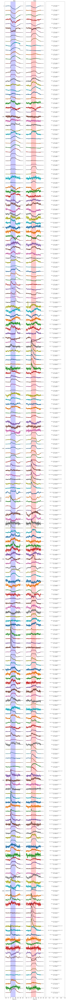

In [7]:
expt_ids_plot = range(len(df_param_ln))
nroi_plot = len(expt_ids_plot)
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(15, nroi_plot), sharey=True,  tight_layout=True)
for cexpt, expt_id in enumerate(expt_ids_plot):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    axs[0].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 4*cexpt, lw=3)
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 4*cexpt, lw=3)
    
    axs[2].text(0.5, -4*cexpt, f'Expt: {expt_id}, ROI: {roi}, Fly: {fly}\nLine: {line}', ha='center', va='center')
    
    # prediction
    ## sine response
    row_s = df_pred_ln[(df_pred_ln['EXPT_ID'] == expt_id) & (df_pred_ln['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 4*cexpt, lw=2, c='k')
    
    ## pulse response
    row_p = df_pred_ln[(df_pred_ln['EXPT_ID'] == expt_id) & (df_pred_ln['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 4*cexpt, lw=2, c='k')
    
axs[0].set_ylabel('ROI index')

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_ylim(-4*nroi_plot, 4)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)

## Paper figures

### Main

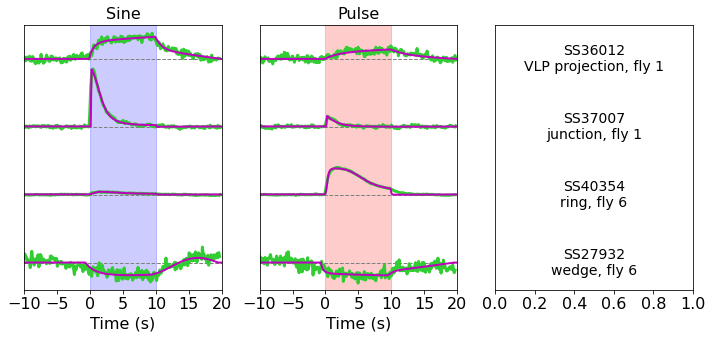

In [20]:
expt_ids_plot = [126, 141, 171, 46]
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(10, 1.2*len(expt_ids_plot)), sharey=True,  tight_layout=True)
for cexpt, expt_id in enumerate(expt_ids_plot):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].axhline(-10*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 10*cexpt, lw=3, c='limegreen')
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-10*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 10*cexpt, lw=3, c='limegreen')
    
    axs[2].text(0.5, -10*cexpt, f'{line}\n{roi}, fly {fly+1}', ha='center', va='center', fontsize=14)
    
    # prediction
    ## sine response
    row_s = df_pred_ln[(df_pred_ln['EXPT_ID'] == expt_id) & (df_pred_ln['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 10*cexpt, lw=2, c='m')
    
    ## pulse response
    row_p = df_pred_ln[(df_pred_ln['EXPT_ID'] == expt_id) & (df_pred_ln['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 10*cexpt, lw=2, c='m')
    
    
# axs[0].set_ylabel('ROI index')
axs[0].set_yticks([])

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_xlim(-10, 20)
    ax.set_ylim(-10*len(expt_ids_plot)+6, 5)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)
fig.savefig('ms/fig1c_ln2e_fits.svg')

### Supp

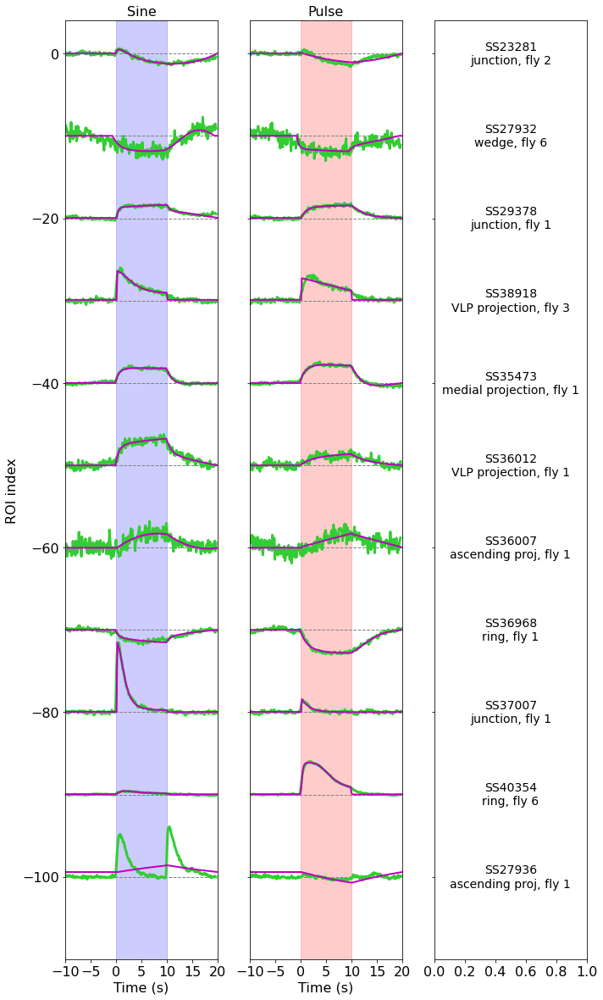

In [18]:
expt_ids_plot = [28, 46, 93, 148, 102, 126, 124, 132, 141, 171, 66]
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(10, 1.5*len(expt_ids_plot)), sharey=True,  tight_layout=True)
for cexpt, expt_id in enumerate(expt_ids_plot):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].axhline(-10*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 10*cexpt, lw=3, c='limegreen')
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-10*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 10*cexpt, lw=3, c='limegreen')
    
    axs[2].text(0.5, -10*cexpt, f'{line}\n{roi}, fly {fly+1}', ha='center', va='center', fontsize=14)
    
    # prediction
    ## sine response
    row_s = df_pred_ln[(df_pred_ln['EXPT_ID'] == expt_id) & (df_pred_ln['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 10*cexpt, lw=2, c='m')
    
    ## pulse response
    row_p = df_pred_ln[(df_pred_ln['EXPT_ID'] == expt_id) & (df_pred_ln['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 10*cexpt, lw=2, c='m')
    
    
axs[0].set_ylabel('ROI index')

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_xlim(-10, 20)
    ax.set_ylim(-10*len(expt_ids_plot), 4)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)
fig.savefig('ms/sfig1b_ln2e_fits.svg')